In [547]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from imblearn.combine import SMOTETomek
import math
import warnings
warnings. filterwarnings('ignore')

In [548]:
rs=1331 ##random_state

In [549]:
train= pd.read_csv(r"C:\Users\harsh\Downloads\train.csv")
test= pd.read_csv(r'C:\Users\harsh\Downloads\test.csv')

In [550]:
test.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
0,8724,Technology,region_26,Bachelor's,m,sourcing,1,24,NaN,1,1,0,77
1,74430,HR,region_4,Bachelor's,f,other,1,31,3.0,5,0,0,51
2,72255,Sales & Marketing,region_13,Bachelor's,m,other,1,31,1.0,4,0,0,47
3,38562,Procurement,region_2,Bachelor's,f,other,3,31,2.0,9,0,0,65
4,64486,Finance,region_29,Bachelor's,m,sourcing,1,30,4.0,7,0,0,61


In [551]:
train.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [552]:
print(train.columns)
print("*"*100)
print(test.columns)

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'is_promoted'],
      dtype='object')
****************************************************************************************************
Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score'],
      dtype='object')


In [553]:
print("Train data shape",train.shape)
print("Test data shape",test.shape)

Train data shape (54808, 14)
Test data shape (23490, 13)


In [554]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


In [555]:
train.describe(include='all')

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808,54808,52399,54808,54808,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
unique,NaN,9,34,3,2,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Sales & Marketing,region_2,Bachelor's,m,other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,16840,12343,36669,38496,30446,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,39195.830627,NaN,NaN,NaN,NaN,NaN,1.253011,34.803915,3.329256,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,NaN,NaN,NaN,NaN,NaN,0.609264,7.660169,1.259993,4.265094,0.477590,0.150450,13.371559,0.279137
min,1.000000,NaN,NaN,NaN,NaN,NaN,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,NaN,NaN,NaN,NaN,NaN,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,NaN,NaN,NaN,NaN,NaN,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,NaN,NaN,NaN,NaN,NaN,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000


In [556]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23490 entries, 0 to 23489
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           23490 non-null  int64  
 1   department            23490 non-null  object 
 2   region                23490 non-null  object 
 3   education             22456 non-null  object 
 4   gender                23490 non-null  object 
 5   recruitment_channel   23490 non-null  object 
 6   no_of_trainings       23490 non-null  int64  
 7   age                   23490 non-null  int64  
 8   previous_year_rating  21678 non-null  float64
 9   length_of_service     23490 non-null  int64  
 10  KPIs_met >80%         23490 non-null  int64  
 11  awards_won?           23490 non-null  int64  
 12  avg_training_score    23490 non-null  int64  
dtypes: float64(1), int64(7), object(5)
memory usage: 2.3+ MB


In [557]:
test.describe(include='all')

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score
count,23490.000000,23490,23490,22456,23490,23490,23490.000000,23490.000000,21678.000000,23490.000000,23490.000000,23490.000000,23490.000000
unique,NaN,9,34,3,2,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Sales & Marketing,region_2,Bachelor's,m,other,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,7315,5299,15578,16596,13078,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,39041.399149,NaN,NaN,NaN,NaN,NaN,1.254236,34.782929,3.339146,5.810387,0.358834,0.022776,63.263133
std,22640.809201,NaN,NaN,NaN,NaN,NaN,0.600910,7.679492,1.263294,4.207917,0.479668,0.149191,13.411750
min,3.000000,NaN,NaN,NaN,NaN,NaN,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000
25%,19370.250000,NaN,NaN,NaN,NaN,NaN,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000
50%,38963.500000,NaN,NaN,NaN,NaN,NaN,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000
75%,58690.000000,NaN,NaN,NaN,NaN,NaN,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000


In [558]:
train.isna().sum()

employee_id                0
department                 0
region                     0
education               2409
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    4124
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
is_promoted                0
dtype: int64

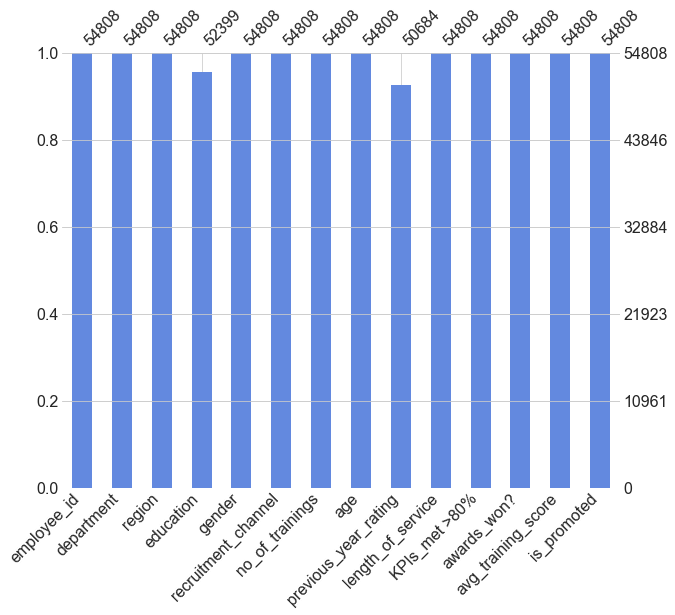

In [559]:
#Using missingno to visualize null values in train data
import missingno as msno
msno.bar(train, color = '#6389df', figsize = (10,8))  


In [560]:
test.isna().sum()

employee_id                0
department                 0
region                     0
education               1034
gender                     0
recruitment_channel        0
no_of_trainings            0
age                        0
previous_year_rating    1812
length_of_service          0
KPIs_met >80%              0
awards_won?                0
avg_training_score         0
dtype: int64

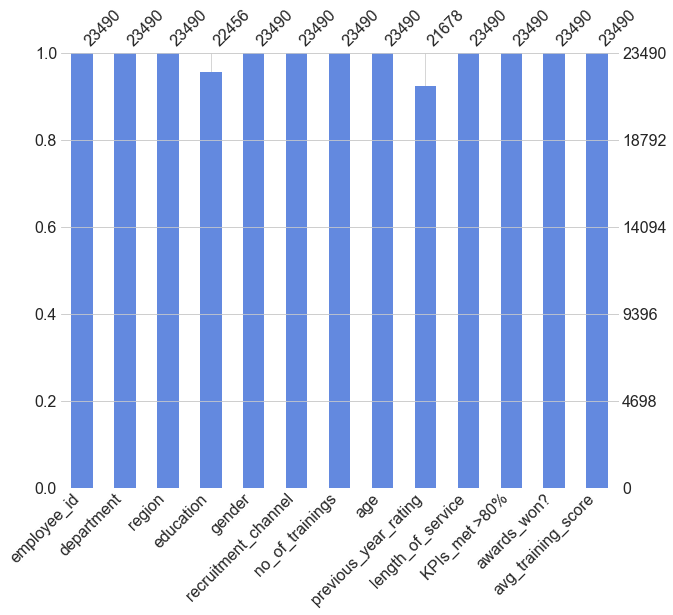

In [561]:
#Using missingno to visualize null values in test data
msno.bar(test, color = '#6389df', figsize = (10,8))  


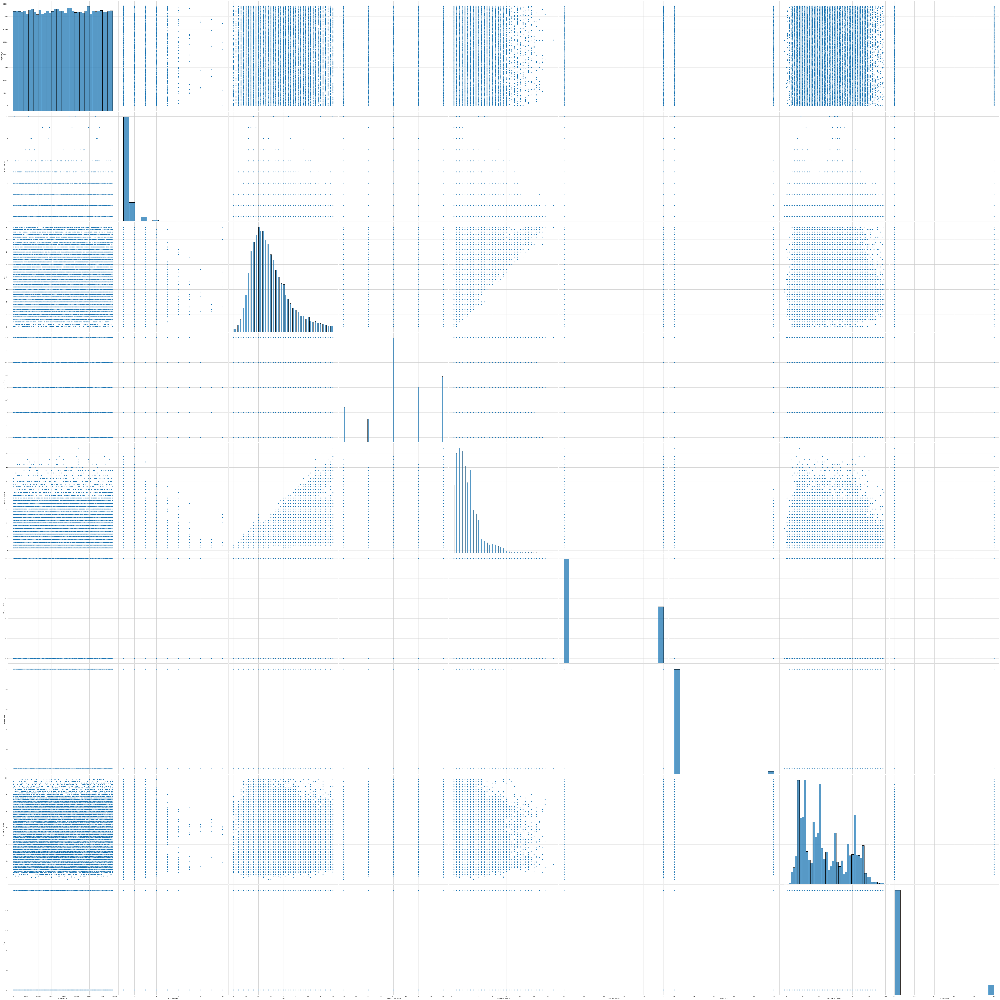

In [562]:
sns.pairplot(train,size=10)

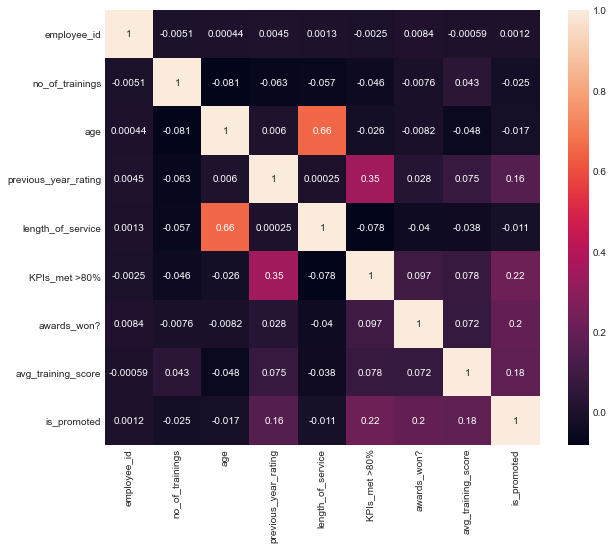

In [563]:
#Correlation between features through heatmap
corr=train.corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr,square=True,annot=True)

In [564]:
train.dtypes

employee_id               int64
department               object
region                   object
education                object
gender                   object
recruitment_channel      object
no_of_trainings           int64
age                       int64
previous_year_rating    float64
length_of_service         int64
KPIs_met >80%             int64
awards_won?               int64
avg_training_score        int64
is_promoted               int64
dtype: object

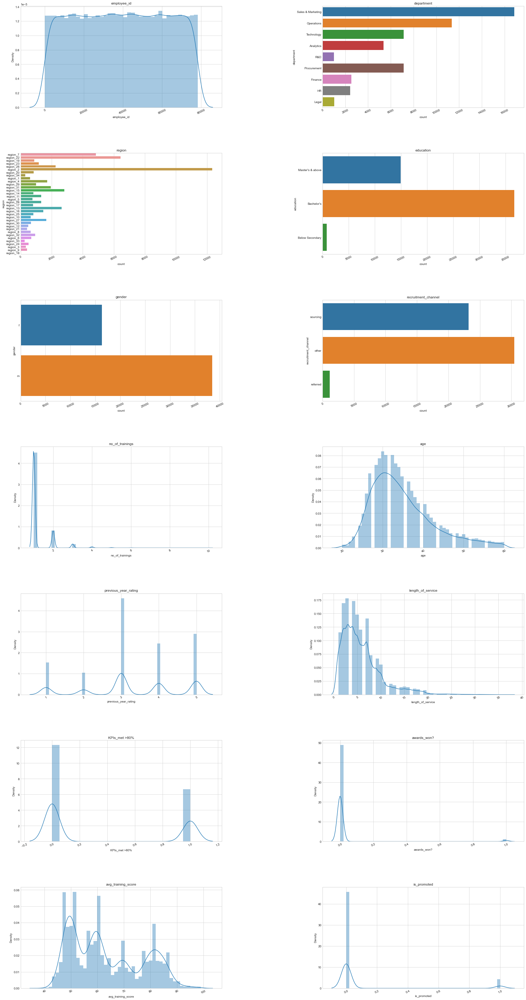

In [565]:
# Let’s plot the distribution of each feature
def plot_distribution(dataset, cols=5, width=20, height=15, hspace=0.2, wspace=0.5):
    plt.style.use('seaborn-whitegrid')
    fig = plt.figure(figsize=(width,height))
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=wspace, hspace=hspace)
    rows = math.ceil(float(dataset.shape[1]) / cols)
    for i, column in enumerate(dataset.columns):
        ax = fig.add_subplot(rows, cols, i + 1)
        ax.set_title(column)
        if dataset.dtypes[column] == np.object:
            g = sns.countplot(y=column, data=dataset)
            substrings = [s.get_text()[:18] for s in g.get_yticklabels()]
            g.set(yticklabels=substrings)
            plt.xticks(rotation=25)
        else:
            g = sns.distplot(dataset[column])
            plt.xticks(rotation=25)
    
plot_distribution(train,cols=2, width=30, height=60, hspace=0.45, wspace=0.5)

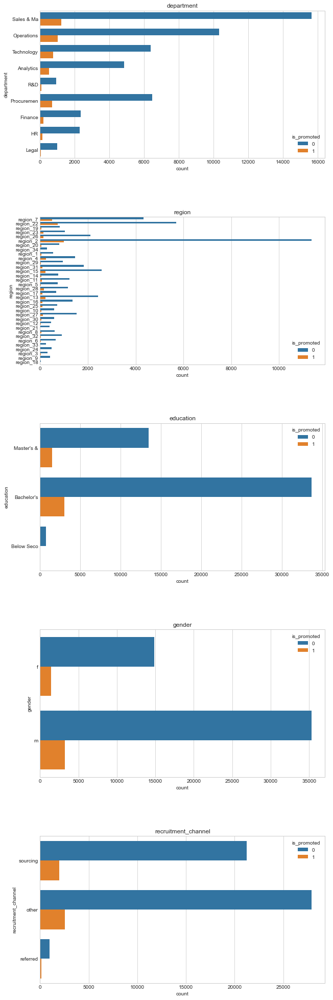

In [566]:
# BIVARIATE ANALYSIS
def plot_bivariate_bar(dataset, hue, cols=5, width=20, height=15, hspace=0.2, wspace=0.5):
    dataset = dataset.select_dtypes(include=[np.object])
    plt.style.use('seaborn-whitegrid')
    fig = plt.figure(figsize=(width,height))
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=wspace, hspace=hspace)
    rows = math.ceil(float(dataset.shape[1]) / cols)
    for i, column in enumerate(dataset.columns):
        ax = fig.add_subplot(rows, cols, i + 1)
        ax.set_title(column)
        if dataset.dtypes[column] == np.object:
            g = sns.countplot(y=column, hue=hue, data=dataset)
            substrings = [s.get_text()[:10] for s in g.get_yticklabels()]
            g.set(yticklabels=substrings)
            
            
            
plot_bivariate_bar(train, hue=train.is_promoted, cols=1, width=10, height=35, hspace=0.4, wspace=0.5)

In [567]:
#unique value in education feature
train.education.value_counts()

Bachelor's          36669
Master's & above    14925
Below Secondary       805
Name: education, dtype: int64

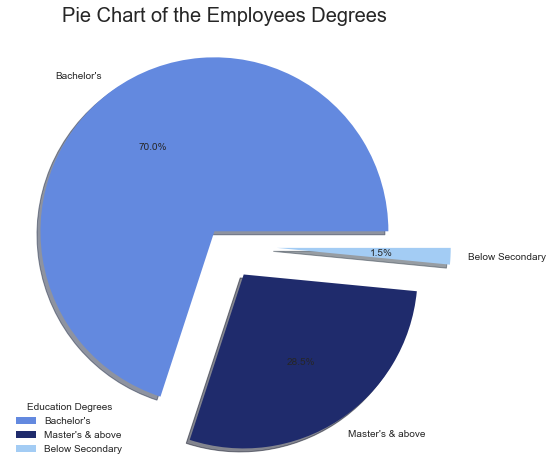

In [568]:
#plotting a pie chart
size = [36669,14925,805]
label=["Bachelor's","Master's & above",'Below Secondary']
color=['#6389df','#1f2b6c','#a3ccf4']
explode = [0.1, 0.2 , 0.3]
plt.figure(figsize=(8,8))
plt.pie(size,labels=label,colors=color,explode=explode,shadow=True,autopct="%.1f%%")
plt.title("Pie Chart of the Employees Degrees", fontsize = 20)
plt.axis('off')
plt.legend(title='Education Degrees')
plt.show()

In [569]:
#unique value in gender feature
train.gender.value_counts()

m    38496
f    16312
Name: gender, dtype: int64

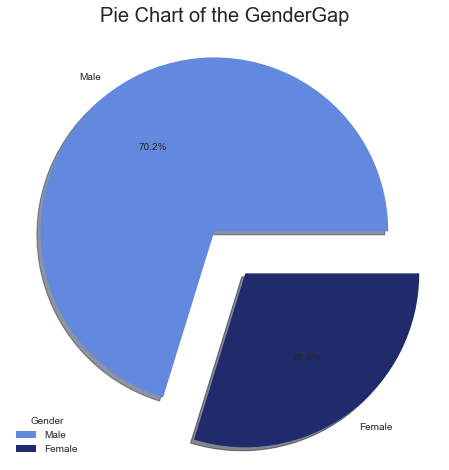

In [570]:
#plotting a pie chart
size = [38496,16312]
label=["Male","Female"]
color=['#6389df','#1f2b6c']
explode = [0.1, 0.2 ]
plt.figure(figsize=(8,8))
plt.pie(size,labels=label,colors=color,explode=explode,shadow=True,autopct="%.1f%%")
plt.title("Pie Chart of the GenderGap", fontsize = 20)
plt.axis('off')
plt.legend(title='Gender')
plt.show()

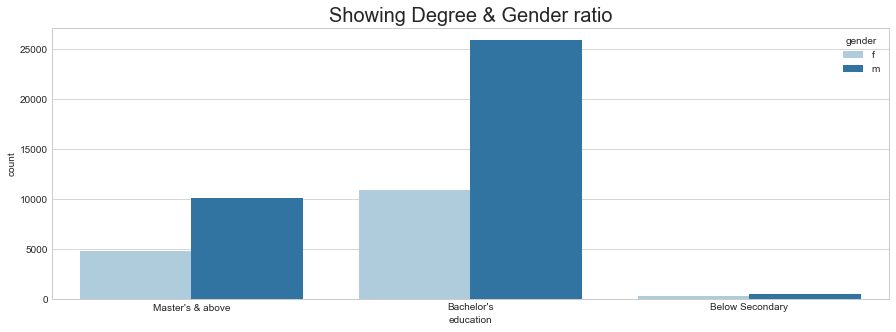

In [571]:
plt.subplots(figsize=(15,5))
sns.countplot(x = 'education', data = train, hue = 'gender', palette = 'Paired')
plt.title('Showing Degree & Gender ratio', fontsize = 20)
plt.show()

In [572]:
train['recruitment_channel'].value_counts()

other       30446
sourcing    23220
referred     1142
Name: recruitment_channel, dtype: int64

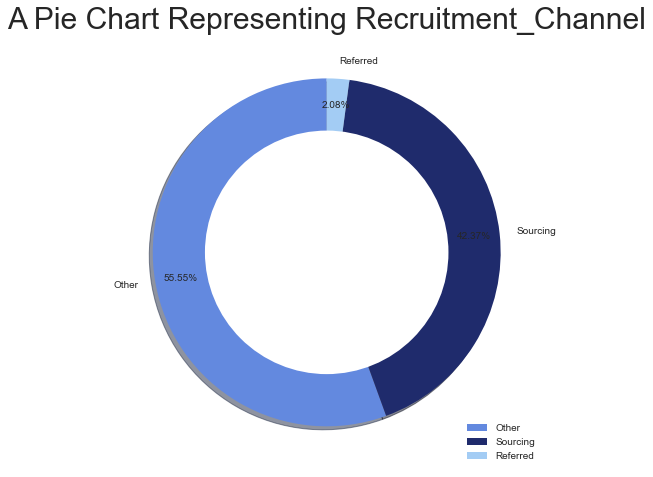

In [573]:
size=[30446,23220,1142]
label=["Other","Sourcing",'Referred']
color=['#6389df','#1f2b6c','#a3ccf4']
explode=[.05,.05,.05]
plt.figure(figsize=(8,8))
plt.pie(size,labels=label,colors=color, startangle=90,shadow=True,autopct="%.2f%%",pctdistance=.85)

center_circle=plt.Circle((0,0),.7,fc='white')
fig=plt.gcf()
fig.gca().add_artist(center_circle)

plt.title('A Pie Chart Representing Recruitment_Channel', fontsize = 30)
plt.axis('off')
plt.legend()
plt.show()


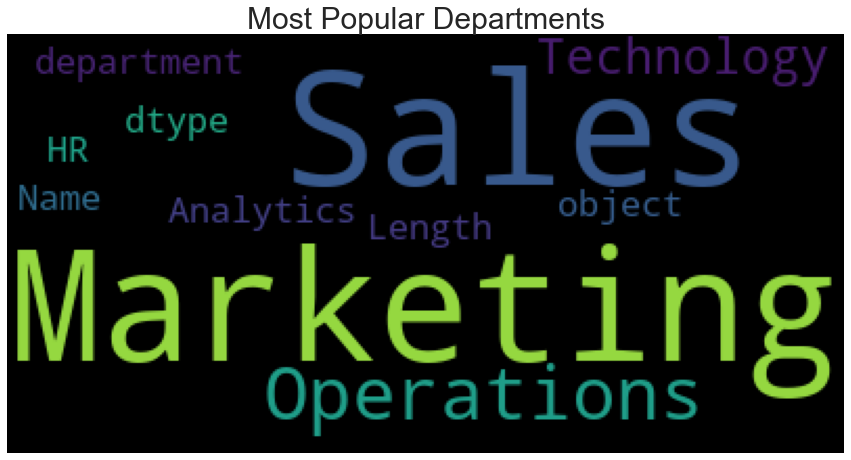

In [574]:
#### Check most popular department
from wordcloud import WordCloud
from wordcloud import STOPWORDS

stopword = set(STOPWORDS)

wordcloud = WordCloud(stopwords = stopword).generate(str(train['department']))

plt.rcParams['figure.figsize'] = (15, 8)
print(wordcloud)
plt.imshow(wordcloud)
plt.title('Most Popular Departments', fontsize = 30)
plt.axis('off')
plt.show()

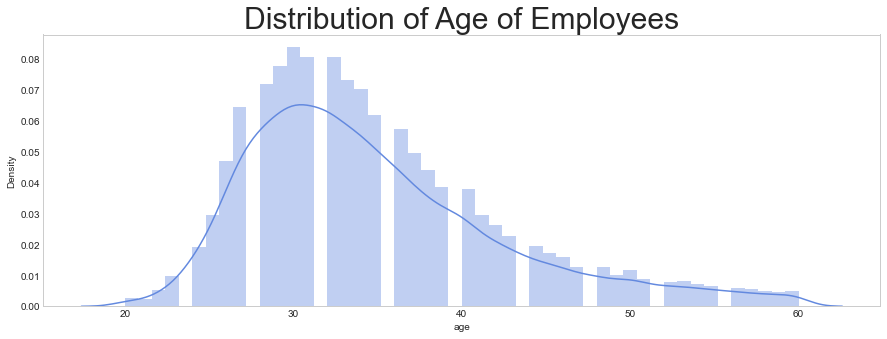

In [575]:
plt.figure(figsize=(15,5))
sns.distplot(train['age'],color='#6389df')
plt.title('Distribution of Age of Employees', fontsize = 30)
plt.grid(axis='both')
plt.show()

In [576]:
#pie chart for the KPIs_met
train['KPIs_met >80%'].value_counts()

0    35517
1    19291
Name: KPIs_met >80%, dtype: int64

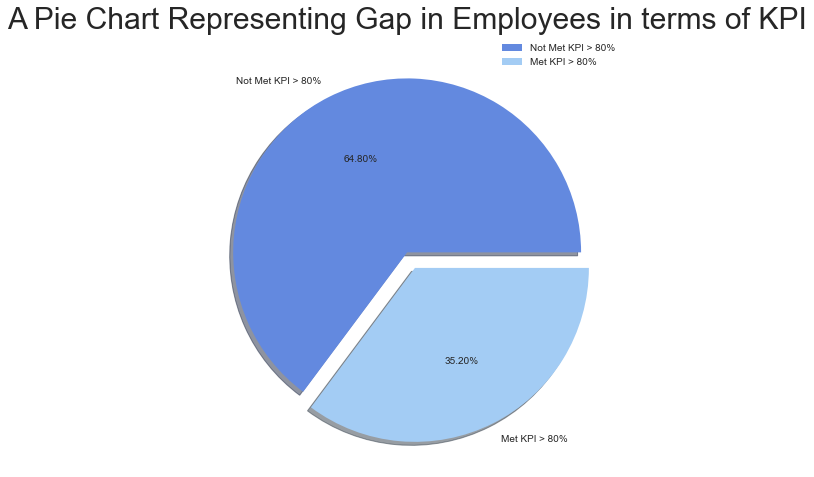

In [577]:
size = [35517, 19291]
labels = "Not Met KPI > 80%", "Met KPI > 80%"
color=['#6389df','#a3ccf4']
explode = [0, 0.1]
plt.figure(figsize=(8,8))
plt.pie(size, labels = labels, colors = color, explode = explode, shadow = True, autopct = "%.2f%%")
plt.title('A Pie Chart Representing Gap in Employees in terms of KPI', fontsize = 30)
plt.axis('off')
plt.legend()
plt.show()

In [578]:
train['awards_won?'].value_counts()

0    53538
1     1270
Name: awards_won?, dtype: int64

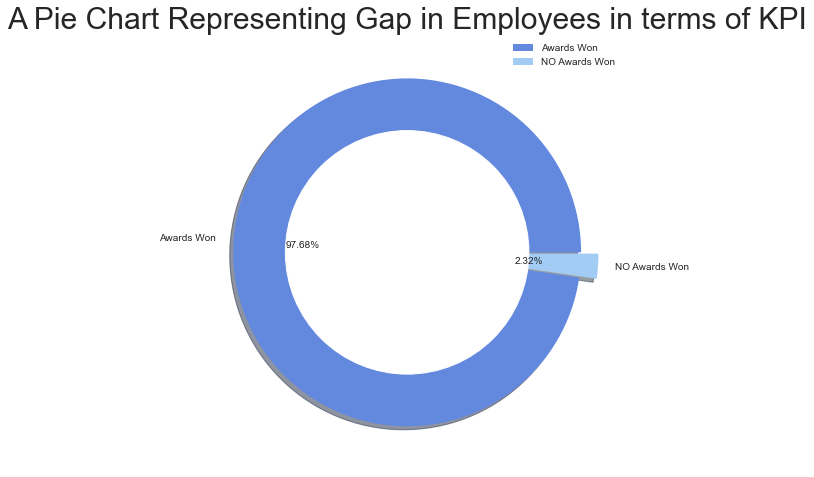

In [579]:
size = [53538,1270]
labels = "Awards Won", "NO Awards Won"
color=['#6389df','#a3ccf4']
explode = [0, 0.1]

my_circle = plt.Circle((0, 0), 0.7, color = 'white')

plt.figure(figsize=(8,8))
plt.pie(size, labels = labels, colors = color, explode = explode, shadow = True, autopct = "%.2f%%")
plt.title('A Pie Chart Representing Gap in Employees in terms of KPI', fontsize = 30)
p = plt.gcf()
p.gca().add_artist(my_circle)
plt.legend()
plt.show()

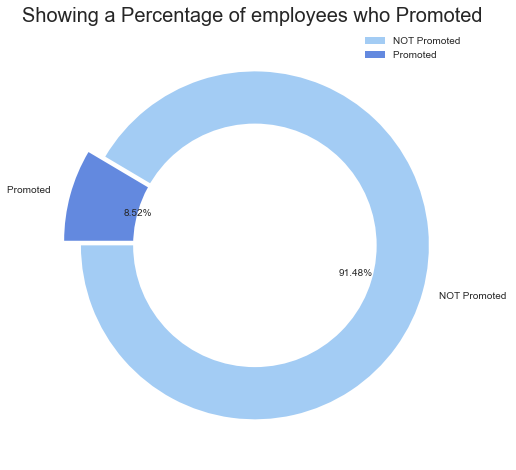

In [580]:
size = [50140, 4668]
labels = "NOT Promoted ", "Promoted "
color=['#a3ccf4','#6389df']
explode = [0, 0.1]

#draw circle
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.rcParams['figure.figsize'] = (8, 8)
plt.pie(size, labels = labels, colors = color, explode = explode, shadow =False, autopct = "%.2f%%",startangle=180)
plt.title('Showing a Percentage of employees who Promoted ' , fontsize = 20)
plt.axis('off')
plt.legend()
plt.show()

In [581]:
## BIVARIATE FEATURE ANALYSIS

In [582]:
train.columns

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'is_promoted'],
      dtype='object')

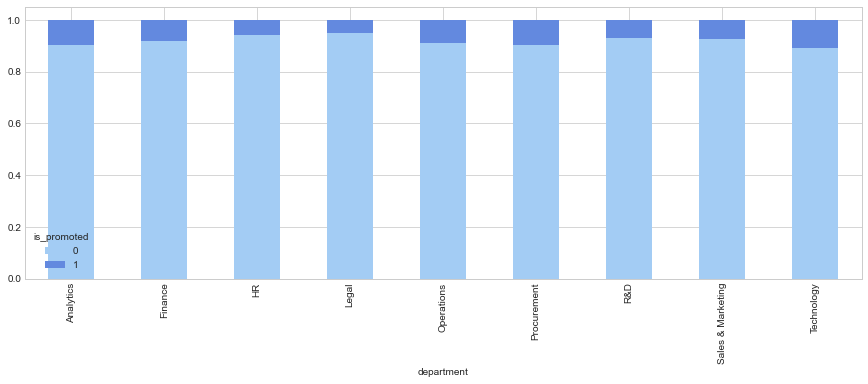

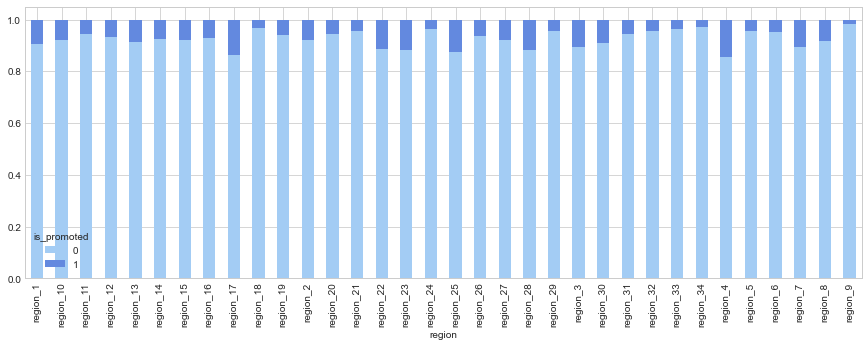

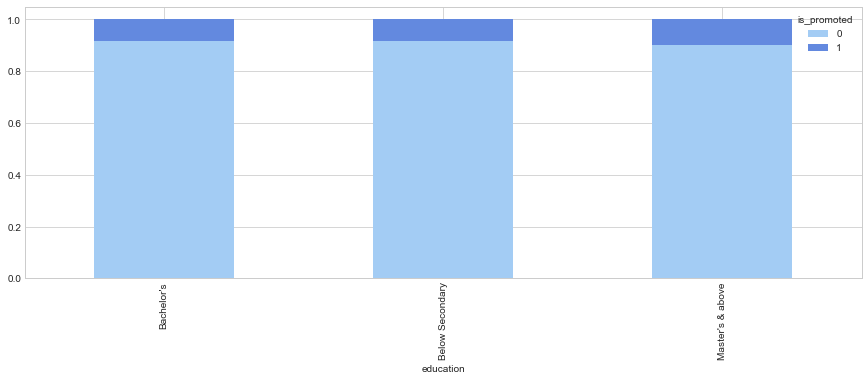

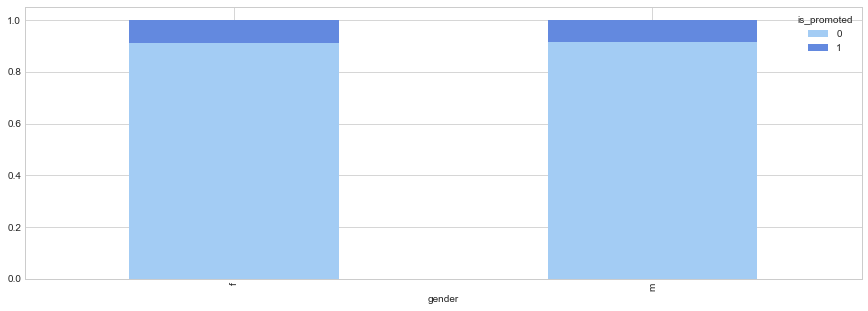

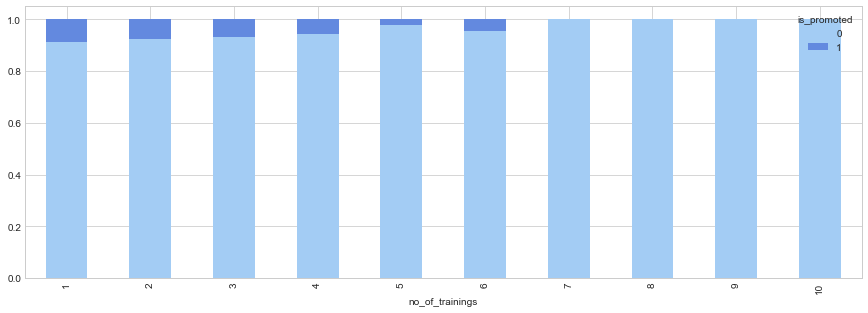

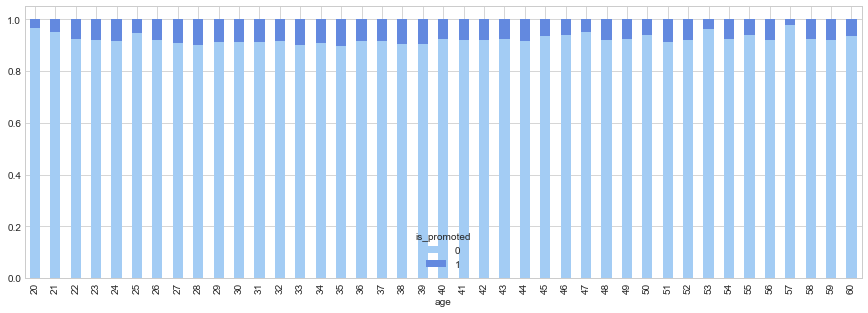

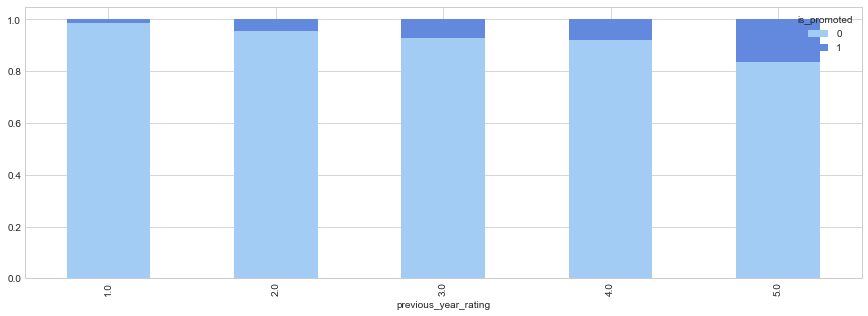

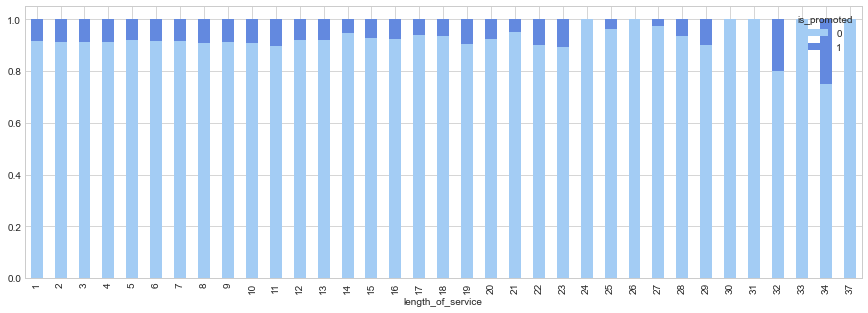

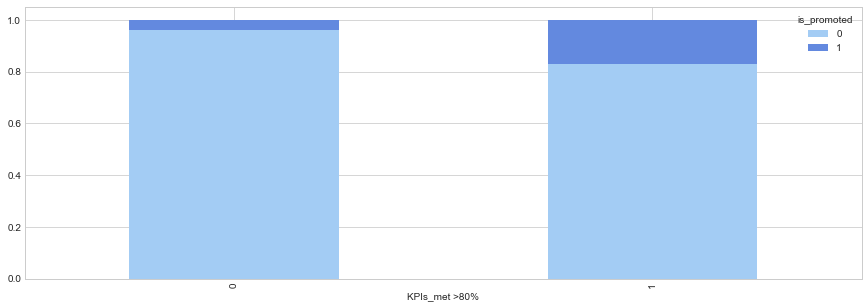

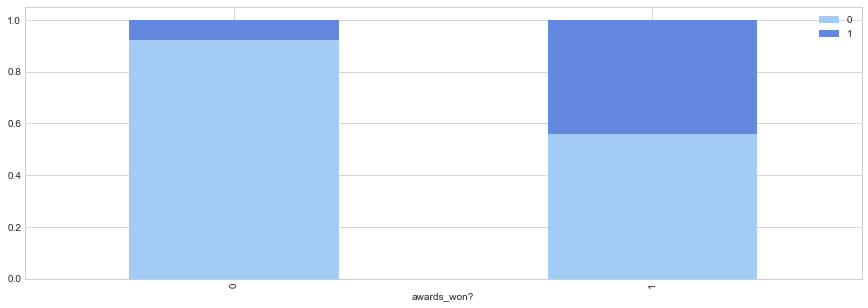

In [583]:
a=['department', 'region', 'education', 'gender', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?']
for i in a:
  data = pd.crosstab(train[i],train['is_promoted'])
  data.div(data.sum(1).astype('float'), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15, 5), color = ['#a3ccf4','#6389df'])

plt.legend()
plt.show()

In [584]:
import plotly.express as px
fig = px.parallel_categories(train[['department','education','gender','previous_year_rating','KPIs_met >80%',
                                    'recruitment_channel',
                                   'is_promoted']], 
                             color="is_promoted", 
                             color_continuous_scale=px.colors.sequential.Aggrnyl  )
fig.show()

## 3

### CHECKING DUPLICATES AND REMOVAL

In [585]:
# Python Method 4 : Removes Data Duplicates while Retaining the First one - Similar to SQL DISTINCT :
def remove_duplicate(data):
    
    print("BEFORE REMOVING DUPLICATES - No. of Rows = ",data.shape[0])
    data.drop_duplicates(keep="first", inplace=True) 
    print("AFTER REMOVING DUPLICATES  - No. of Rows = ",data.shape[0])
    return "Checked Duplicates"
# Remove Duplicates from "train" data :
remove_duplicate(train)
# No Duplicates at all !!!

BEFORE REMOVING DUPLICATES - No. of Rows =  54808
AFTER REMOVING DUPLICATES  - No. of Rows =  54808


'Checked Duplicates'

### Checking Missing Value

In [586]:
##missing value function which return an dataframe with total null values and percentage
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data(train)

,Total,Percent
previous_year_rating,4124,7.524449
education,2409,4.395344
is_promoted,0,0.000000
avg_training_score,0,0.000000
awards_won?,0,0.000000
KPIs_met >80%,0,0.000000
length_of_service,0,0.000000
age,0,0.000000
no_of_trainings,0,0.000000
recruitment_channel,0,0.000000


In [587]:
missing_data(test)

,Total,Percent
previous_year_rating,1812,7.713921
education,1034,4.401873
avg_training_score,0,0.000000
awards_won?,0,0.000000
KPIs_met >80%,0,0.000000
length_of_service,0,0.000000
age,0,0.000000
no_of_trainings,0,0.000000
recruitment_channel,0,0.000000
gender,0,0.000000


In [588]:
train.previous_year_rating=train.previous_year_rating.fillna(0)
test.previous_year_rating=test.previous_year_rating.fillna(0)

* `ffill is used to forward fill the missing values in the dataset - https://www.geeksforgeeks.org/python-pandas-dataframe-ffill/`

* `bfill is used to backward fill the missing values in the dataset - https://www.geeksforgeeks.org/python-pandas-dataframe-bfill/`

In [589]:
train['Fresher']=train['previous_year_rating'].apply(lambda x: 'Fresher' if x==0 else 'Experienced')
test['Fresher']=test['previous_year_rating'].apply(lambda x: 'Fresher' if x==0 else 'Experienced')

In [590]:
train['education']=train['education'].ffill(axis=0)
train['education']=train['education'].bfill(axis=0)

test['education']=test['education'].ffill(axis=0)
test['education']=test['education'].bfill(axis=0)

In [591]:
display(missing_data(train))
display(missing_data(test))


,Total,Percent
Fresher,0,0.0
is_promoted,0,0.0
avg_training_score,0,0.0
awards_won?,0,0.0
KPIs_met >80%,0,0.0
length_of_service,0,0.0
previous_year_rating,0,0.0
age,0,0.0
no_of_trainings,0,0.0
recruitment_channel,0,0.0


,Total,Percent
Fresher,0,0.0
avg_training_score,0,0.0
awards_won?,0,0.0
KPIs_met >80%,0,0.0
length_of_service,0,0.0
previous_year_rating,0,0.0
age,0,0.0
no_of_trainings,0,0.0
recruitment_channel,0,0.0
gender,0,0.0


### FEATURE ENGINEERING

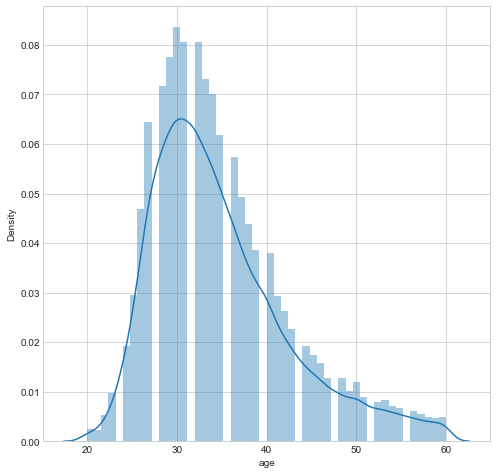

In [592]:
#BINNING THE AGE FEATURE IN 20-29 , 29-39 , 39-49 
sns.distplot(train['age'])

train['age'] = pd.cut( x=train['age'], bins=[20, 29, 39, 49], labels=['20', '30', '40'] )
test['age']  = pd.cut( x=test['age'], bins=[20, 29, 39, 49],  labels=['20', '30', '40'] )

In [593]:
train.age.value_counts(dropna=False)

30     28030
20     14340
40      8952
NaN     3486
Name: age, dtype: int64

In [595]:
test.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,Fresher
0,8724,Technology,region_26,Bachelor's,m,sourcing,1,20,0.0,1,1,0,77,Fresher
1,74430,HR,region_4,Bachelor's,f,other,1,30,3.0,5,0,0,51,Experienced
2,72255,Sales & Marketing,region_13,Bachelor's,m,other,1,30,1.0,4,0,0,47,Experienced
3,38562,Procurement,region_2,Bachelor's,f,other,3,30,2.0,9,0,0,65,Experienced
4,64486,Finance,region_29,Bachelor's,m,sourcing,1,30,4.0,7,0,0,61,Experienced


In [535]:
train.drop(['employee_id'],axis=1,inplace=True)
test_d=test

In [536]:
test_d.drop(['employee_id'],axis=1,inplace=True)

In [537]:
test_d.head()

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,Fresher
0,Technology,region_26,Bachelor's,m,sourcing,1,20,0.0,1,1,0,77,Fresher
1,HR,region_4,Bachelor's,f,other,1,30,3.0,5,0,0,51,Experienced
2,Sales & Marketing,region_13,Bachelor's,m,other,1,30,1.0,4,0,0,47,Experienced
3,Procurement,region_2,Bachelor's,f,other,3,30,2.0,9,0,0,65,Experienced
4,Finance,region_29,Bachelor's,m,sourcing,1,30,4.0,7,0,0,61,Experienced


### Encoding 
`converting the categorical features into binary or numerical counterparts`

In [599]:
def data_encoding( encoding_strategy , encoding_data , encoding_columns ):
    
    if encoding_strategy == "LabelEncoding":
        print("IF LabelEncoding")
        Encoder = LabelEncoder()
        for column in encoding_columns :
            print("column",column )
            encoding_data[ column ] = Encoder.fit_transform(tuple(encoding_data[ column ]))
        
    elif encoding_strategy == "OneHotEncoding":
        print("ELIF OneHotEncoding")
        encoding_data = pd.get_dummies(encoding_data)
        
    dtypes_list =['float64','float32','int64','int32']
    encoding_data.astype( dtypes_list[0] ).dtypes
    
    return encoding_data

In [600]:
encoding_columns  = [ "region", "age","department", "education", "gender", "recruitment_channel" ]
encoding_strategy = [ "LabelEncoding", "OneHotEncoding"]

train_encode = data_encoding( encoding_strategy[1] , train , encoding_columns )
test_encode =  data_encoding( encoding_strategy[1] , test  , encoding_columns )

ELIF OneHotEncoding
ELIF OneHotEncoding


In [609]:
test_encode.head()

,employee_id,no_of_trainings,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,department_Analytics,department_Finance,department_HR,...,gender_f,gender_m,recruitment_channel_other,recruitment_channel_referred,recruitment_channel_sourcing,age_20,age_30,age_40,Fresher_Experienced,Fresher_Fresher
0,-0.769066,0.0,-1.5,-1.00,1.0,0.0,0.68,0.0,0.0,0.0,...,0.0,0.0,-1.0,0.0,1.0,1.0,-1.0,0.0,-1.0,1.0
1,0.902002,0.0,0.0,0.00,0.0,0.0,-0.36,0.0,0.0,1.0,...,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.846686,0.0,-1.0,-0.25,0.0,0.0,-0.52,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.010211,2.0,-0.5,1.00,0.0,0.0,0.20,0.0,0.0,0.0,...,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.649101,0.0,0.5,0.50,0.0,0.0,0.04,0.0,1.0,0.0,...,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [603]:
train_encode.head()

,employee_id,no_of_trainings,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted,department_Analytics,department_Finance,...,gender_f,gender_m,recruitment_channel_other,recruitment_channel_referred,recruitment_channel_sourcing,age_20,age_30,age_40,Fresher_Experienced,Fresher_Fresher
0,65438,1,5.0,8,1,0,49,0,0,0,...,1,0,0,0,1,0,1,0,1,0
1,65141,1,5.0,4,0,0,60,0,0,0,...,0,1,1,0,0,0,1,0,1,0
2,7513,1,3.0,7,0,0,50,0,0,0,...,0,1,0,0,1,0,1,0,1,0
3,2542,2,1.0,10,0,0,50,0,0,0,...,0,1,1,0,0,0,1,0,1,0
4,48945,1,3.0,2,0,0,73,0,0,0,...,0,1,1,0,0,0,0,1,1,0


### FEATURE SCALING

In [604]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer, RobustScaler, MaxAbsScaler
def data_scaling( scaling_strategy , scaling_data , scaling_columns ):
    
    if    scaling_strategy =="RobustScaler" :
        scaling_data[scaling_columns] = RobustScaler().fit_transform(scaling_data[scaling_columns])
        
    elif  scaling_strategy =="StandardScaler" :
        scaling_data[scaling_columns] = StandardScaler().fit_transform(scaling_data[scaling_columns])
        
    elif  scaling_strategy =="MinMaxScaler" :
        scaling_data[scaling_columns] = MinMaxScaler().fit_transform(scaling_data[scaling_columns])
        
    elif  scaling_strategy =="MaxAbsScaler" :
        scaling_data[scaling_columns] = MaxAbsScaler().fit_transform(scaling_data[scaling_columns])
        
    else :  # If any other scaling send by mistake still perform Robust Scalar
        scaling_data[scaling_columns] = RobustScaler().fit_transform(scaling_data[scaling_columns])
    
    return scaling_data

In [607]:
scaling_st=["RobustScaler" ,"StandardScaler","MinMaxScaler","MaxAbsScaler"]

train_scale=data_scaling(scaling_st[0],train_encode,train_encode.columns)
test_scale=data_scaling(scaling_st[0],test_encode,test_encode.columns)

In [610]:
test_encode.head()

,employee_id,no_of_trainings,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,department_Analytics,department_Finance,department_HR,...,gender_f,gender_m,recruitment_channel_other,recruitment_channel_referred,recruitment_channel_sourcing,age_20,age_30,age_40,Fresher_Experienced,Fresher_Fresher
0,-0.769066,0.0,-1.5,-1.00,1.0,0.0,0.68,0.0,0.0,0.0,...,0.0,0.0,-1.0,0.0,1.0,1.0,-1.0,0.0,-1.0,1.0
1,0.902002,0.0,0.0,0.00,0.0,0.0,-0.36,0.0,0.0,1.0,...,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.846686,0.0,-1.0,-0.25,0.0,0.0,-0.52,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.010211,2.0,-0.5,1.00,0.0,0.0,0.20,0.0,0.0,0.0,...,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.649101,0.0,0.5,0.50,0.0,0.0,0.04,0.0,1.0,0.0,...,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


## Split target variable and predictors

In [663]:
X=train_scale.drop(['is_promoted'],axis=1)
Y=train.is_promoted

## OVERSAMPLING
### Checking of the data is unbalanced or balanced 

In [432]:
train.is_promoted.value_counts(normalize=True)*100

0    91.482995
1     8.517005
Name: is_promoted, dtype: float64

 cleary we can see data is unbalanced with only 8% of 1s in it so we have to use over Sampling on the data so as to make it balanced
#using Smote Over Sampling Method 

## Test train split

In [433]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2,stratify=Y)

In [434]:
def oversample(X,Y):
    over_sample = SMOTETomek(random_state=rs)
    X_over,Y_over = over_sample.fit_resample(X,Y)
    return X_over,Y_over

In [435]:
X_train_os,Y_train_os=oversample(X_train,Y_train)

### FEATURE SELECTION

avg_training_score      0.331638
length_of_service       0.127772
previous_year_rating    0.065417
KPIs_met >80%           0.051556
awards_won?             0.031615
                          ...   
region_region_24        0.001449
region_region_33        0.000992
region_region_9         0.000794
region_region_34        0.000600
region_region_18        0.000234
Length: 62, dtype: float64


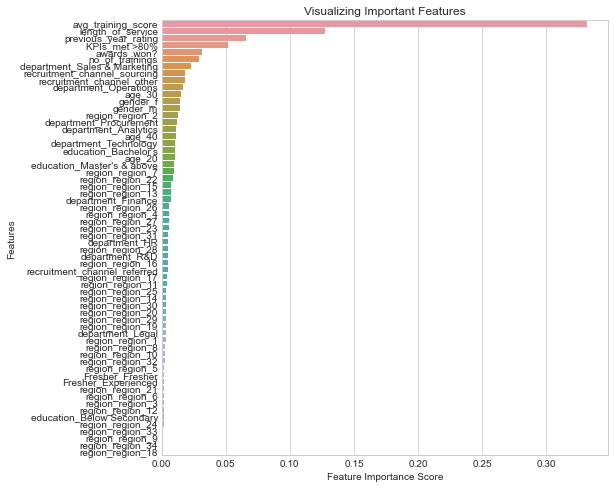

In [436]:
clf = RandomForestClassifier(n_estimators=100, random_state=0)
clf.fit(X_train, Y_train)

### FEATURE SCORES 
feature_scores = pd.Series(clf.feature_importances_, index=X_train.columns).sort_values(ascending=False)
print(feature_scores)

### PLOT TO VISUALIZE
sns.barplot(x=feature_scores, y=feature_scores.index)
# Add labels to the graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
# Add title to the graph
plt.title("Visualizing Important Features")
# Visualize the graph
plt.show()


In [440]:
X_train_os.dtypes

no_of_trainings         float64
previous_year_rating    float64
length_of_service       float64
KPIs_met >80%           float64
awards_won?             float64
                         ...   
age_20                  float64
age_30                  float64
age_40                  float64
Fresher_Experienced     float64
Fresher_Fresher         float64
Length: 62, dtype: object

### CROSS VALIDATION


In [441]:
from sklearn.model_selection import KFold,cross_val_score

In [442]:
## PASSING THE TRAIN DATA IN THE CROSS VALIDATION
kf=KFold(n_splits=5,random_state=rs,shuffle=True)
cnt = 1
# split()  method generate indices to split data into training and test set.
for train_index, test_index in kf.split(X_train_os, Y_train_os):
    print(f'Fold:{cnt}, Train set: {len(train_index)}, Test set:{len(test_index)}')
    cnt+=1

Fold:1, Train set: 63756, Test set:15940
Fold:2, Train set: 63757, Test set:15939
Fold:3, Train set: 63757, Test set:15939
Fold:4, Train set: 63757, Test set:15939
Fold:5, Train set: 63757, Test set:15939


## Model Building 

#### randomforest ✅
#### decision tree
#### cat
#### xgb
#### knn 
#### lgbm 
#### gaussian nayed bias
##### pehle to independent model lagane hai 
##### them inko ensemble karke lagane hai 
    

## 1.RANDOMFOREST CLASSIFIER

In [444]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

from sklearn.model_selection import RandomizedSearchCV

In [447]:
score = cross_val_score(RandomForestClassifier(random_state= rs), X_train_os, Y_train_os, cv= kf, scoring="accuracy")
print(f'Scores for each fold are: {score}')
print(f'Average score: {"{:.2f}".format(score.mean())}')

Scores for each fold are: [0.96750314 0.96850493 0.96982245 0.96612084 0.96994793]
Average score: 0.97


In [450]:
y_pred_rf=rfc.predict(X_train_os)
print(accuracy_score(y_pred_rf,Y_train_os))

0.8851008833567556


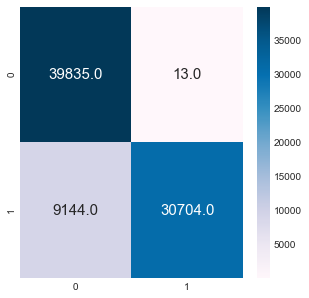

In [451]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(Y_train_os, y_pred_rf)
plt.rcParams['figure.figsize'] = (5, 5)
sns.heatmap(cm, annot = True, annot_kws = {'size':15}, cmap = 'PuBu',fmt=".1f")

In [452]:
y_pred_test=rfc.predict(X_test)
print(accuracy_score(y_pred_test,Y_test))

0.9313993796752418


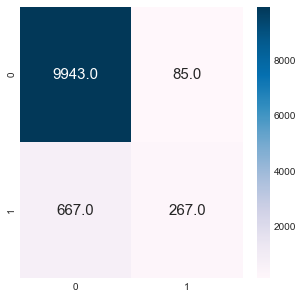

In [453]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(Y_test, y_pred_test)
plt.rcParams['figure.figsize'] = (5, 5)
sns.heatmap(cm, annot = True, annot_kws = {'size':15}, cmap = 'PuBu',fmt=".1f")

In [454]:
print(classification_report(Y_test,y_pred_test))

              precision    recall  f1-score   support

           0       0.94      0.99      0.96     10028
           1       0.76      0.29      0.42       934

    accuracy                           0.93     10962
   macro avg       0.85      0.64      0.69     10962
weighted avg       0.92      0.93      0.92     10962



### Hyperparameter Tuning 
- RANDOM FOREST CLASSIFIER


In [455]:
#Randomized Search CV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]

In [456]:
random_grid={'n_estimators': n_estimators,
            'max_features': max_features,
            'max_depth': max_depth,
            'min_samples_split': min_samples_split,
            'min_samples_leaf': min_samples_leaf}

In [457]:
rf=RandomForestClassifier()

In [459]:
rf_random = RandomizedSearchCV(estimator = rf,param_distributions = random_grid,
                                scoring='f1',  b
                                n_iter = 10, cv = 5,
                                verbose=2, random_state=rs,
                                n_jobs = 1)
rf_random.fit(X_train_os,Y_train_os)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=900; total time= 1.0min
[CV] END max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=900; total time= 1.0min
[CV] END max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=900; total time= 1.0min
[CV] END max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=900; total time= 1.0min
[CV] END max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=900; total time= 1.1min
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=500; total time=  34.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=500; total time=  33.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estima

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=1,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=1331, scoring='f1', verbose=2)

In [460]:
rf_random.best_params_

{'n_estimators': 1100,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 20}

In [461]:
rfc= RandomForestClassifier(random_state=rs,
                            n_estimators=1100,
                            min_samples_split=5,
                            max_features='auto',
                            min_samples_leaf= 1,
                            max_depth=20,oob_score=True)
rfc.fit(X_train_os,Y_train_os)

RandomForestClassifier(max_depth=20, min_samples_split=5, n_estimators=1100,
                       oob_score=True, random_state=1331)

0.96354898614736


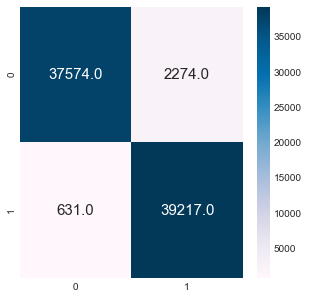

In [462]:
y_pred_rf_ht=rfc.predict(X_train_os)
print(accuracy_score(y_pred_rf_ht,Y_train_os))
cm = confusion_matrix(Y_train_os, y_pred_rf_ht)
plt.rcParams['figure.figsize'] = (5, 5)
sns.heatmap(cm, annot = True, annot_kws = {'size':15}, cmap = 'PuBu',fmt=".1f")

In [463]:
y_pred_test_ht=rfc.predict(X_test)
print(accuracy_score(y_pred_test_ht,Y_test))

0.8821382959313994


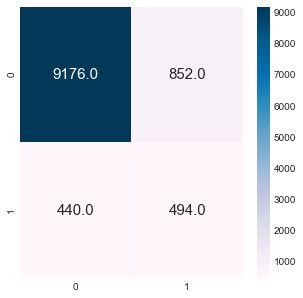

In [465]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

cm = confusion_matrix(Y_test, y_pred_test_ht)
plt.rcParams['figure.figsize'] = (5, 5)
sns.heatmap(cm, annot = True, annot_kws = {'size':15}, cmap = 'PuBu',fmt=".1f")

#### SUBMISSION FILE GENERATION

In [597]:
sub2=pd.DataFrame(y_test_id,columns=['employee_id'])

In [596]:
y_test_id=test.employee_id.values

In [611]:
test_encode.drop(columns=['employee_id'],inplace=True)

In [612]:
y_sub=rfc.predict(test_encode)

In [613]:
sub2['is_promoted']=y_sub

In [614]:
sub2.shape

(23490, 2)

In [616]:
sub2.to_csv('sub2_hr.csv',index=False)

## 2. DECISION TREE


In [617]:
from sklearn.tree import DecisionTreeClassifier

In [618]:
dtc=DecisionTreeClassifier(random_state=rs)
score = cross_val_score(dtc, X_train_os, Y_train_os, cv= kf, scoring="accuracy")
print(f'Scores for each fold are: {score}')
print(f'Average score: {"{:.2f}".format(score.mean())}')

Scores for each fold are: [0.94291092 0.93989585 0.9428446  0.93995859 0.94202899]
Average score: 0.94


### Hyperparameter Tuning 
- Decision Tree CLASSIFIER


In [619]:
def hyperparameter_tuning(X,Y,rf):
#Randomized Search CV
# Number of features to consider at every split
    max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
    max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# max_depth.append(None)
# Minimum number of samples required to split a node
    min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
    min_samples_leaf = [1, 2, 5, 10]

    random_grid={
            'max_features': max_features,
            'max_depth': max_depth,
            'min_samples_split': min_samples_split,
            'min_samples_leaf': min_samples_leaf}

    rf_random = RandomizedSearchCV(estimator = rf,param_distributions = random_grid,
                                scoring='f1', 
                                n_iter = 10, cv = 5,
                                verbose=0, random_state=rs,
                                n_jobs = 1)
    rf_random.fit(X,Y)
    return rf_random.best_params_

In [620]:
param_dt=hyperparameter_tuning(X_train_os,Y_train_os,dtc)

In [254]:
## Printing the best parameters obtained after randomisesearch CV or hyperparameter tuning
print(param_dt)

{'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 25}


In [621]:
dtc=DecisionTreeClassifier(random_state=rs,
                           min_samples_split=10,
                           min_samples_leaf=2,
                           max_features='auto',
                           max_depth=25)
dtc.fit(X_train_os,Y_train_os)
y_pred_train_dc_ht=dtc.predict(X_train_os)
y_pred_test_dt_ht=dtc.predict(X_test)
print('Test Accuracy',accuracy_score(y_pred_test_dt_ht,Y_test))
print('Train Accuracy',accuracy_score(y_pred_train_dc_ht,Y_train_os))

Test Accuracy 0.8533114395183361
Train Accuracy 0.9199583416984541


In [623]:
sub3=sub2.drop('is_promoted',axis=1)

In [624]:
y_sub_dc=dtc.predict(test_encode)

In [625]:
sub3['is_promoted']=y_sub_dc

In [626]:
sub3.shapesub3['is_promoted']=y_sub_dc

(23490, 2)

In [627]:
sub3.to_csv('sub3_hr.csv',index=False)

### Boosting algorithms

In [628]:
# Boosting Algorithms :
from xgboost                          import XGBClassifier
from catboost                         import CatBoostClassifier
from lightgbm                         import LGBMClassifier


In [653]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
mod= CatBoostClassifier(random_state=rs)

par={'max_depth':[5,10,None],
              'n_estimators':[200,300,400,500,600],'learning_rate':[0.1,0.01,0.001]}
def hyperparameter_tuning(mod,param_d,p,q):
    rdmsearch=  RandomizedSearchCV(mod, param_distributions=param_d,n_jobs=-1,cv=9,scoring='roc_auc')
    rdmsearch.fit(p,q)
    ht_params = rdmsearch.best_params_
    ht_score = rdmsearch.best_score_
    return ht_params, ht_score


rf_parameters, rf_ht_score = hyperparameter_tuning(mod, par,  X_train_os,Y_train_os)


0:	learn: 0.5603348	total: 247ms	remaining: 1m 13s
1:	learn: 0.4874654	total: 472ms	remaining: 1m 10s
2:	learn: 0.4429689	total: 692ms	remaining: 1m 8s
3:	learn: 0.4078899	total: 907ms	remaining: 1m 7s
4:	learn: 0.3825900	total: 1.12s	remaining: 1m 5s
5:	learn: 0.3597155	total: 1.34s	remaining: 1m 5s
6:	learn: 0.3409400	total: 1.56s	remaining: 1m 5s
7:	learn: 0.3274801	total: 1.79s	remaining: 1m 5s
8:	learn: 0.3162283	total: 2.02s	remaining: 1m 5s
9:	learn: 0.3062593	total: 2.26s	remaining: 1m 5s
10:	learn: 0.2961891	total: 2.47s	remaining: 1m 5s
11:	learn: 0.2805065	total: 2.71s	remaining: 1m 4s
12:	learn: 0.2748430	total: 2.94s	remaining: 1m 4s
13:	learn: 0.2636244	total: 3.16s	remaining: 1m 4s
14:	learn: 0.2570114	total: 3.38s	remaining: 1m 4s
15:	learn: 0.2499980	total: 3.6s	remaining: 1m 3s
16:	learn: 0.2446814	total: 3.83s	remaining: 1m 3s
17:	learn: 0.2391174	total: 4.04s	remaining: 1m 3s
18:	learn: 0.2348744	total: 4.26s	remaining: 1m 2s
19:	learn: 0.2302117	total: 4.5s	remaini

162:	learn: 0.0906852	total: 35.7s	remaining: 30s
163:	learn: 0.0905308	total: 36s	remaining: 29.8s
164:	learn: 0.0903850	total: 36.2s	remaining: 29.6s
165:	learn: 0.0900886	total: 36.4s	remaining: 29.4s
166:	learn: 0.0897393	total: 36.6s	remaining: 29.1s
167:	learn: 0.0896060	total: 36.8s	remaining: 28.9s
168:	learn: 0.0894289	total: 37s	remaining: 28.7s
169:	learn: 0.0892951	total: 37.3s	remaining: 28.5s
170:	learn: 0.0890413	total: 37.5s	remaining: 28.3s
171:	learn: 0.0888715	total: 37.7s	remaining: 28.1s
172:	learn: 0.0886410	total: 37.9s	remaining: 27.8s
173:	learn: 0.0885112	total: 38.1s	remaining: 27.6s
174:	learn: 0.0883056	total: 38.3s	remaining: 27.4s
175:	learn: 0.0881812	total: 38.5s	remaining: 27.2s
176:	learn: 0.0879025	total: 38.8s	remaining: 26.9s
177:	learn: 0.0876866	total: 39s	remaining: 26.7s
178:	learn: 0.0875039	total: 39.2s	remaining: 26.5s
179:	learn: 0.0873895	total: 39.4s	remaining: 26.3s
180:	learn: 0.0872342	total: 39.6s	remaining: 26.1s
181:	learn: 0.087014

In [654]:
print(rf_parameters, rf_ht_score)

{'n_estimators': 300, 'max_depth': 10, 'learning_rate': 0.1} 0.9925067441838529


In [655]:
mod=XGBClassifier(random_state=rs)
param_tuning = {
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 5, 7, 10],
        'min_child_weight': [1, 3, 5],
        'subsample': [0.5, 0.7],
        'colsample_bytree': [0.5, 0.7],
        'n_estimators' : [100, 200, 500]
                }
rf_parameters_xgb, rf_ht_score_xgb = hyperparameter_tuning(mod, param_tuning,  X_train_os,Y_train_os)

In [656]:
print(rf_parameters_xgb, rf_ht_score_xgb)

{'subsample': 0.5, 'n_estimators': 200, 'min_child_weight': 1, 'max_depth': 10, 'learning_rate': 0.1, 'colsample_bytree': 0.7} 0.9930464894186972


In [680]:
# Create a Dictionary (Key->Value Pairs) for "ML Model Name"-> "ML Model Functions with Hyper-Parameters" :

Classifiers = {'0.XGBoost' : XGBClassifier(learning_rate =0.1, 
                                           n_estimators=394, 
                                           max_depth=10, 
                                           subsample = 0.50, 
                                           verbosity = 0,
                                           scale_pos_weight = 2.5,
                                           updater ="grow_histmaker",
                                           base_score  = 0.2,
                                          min_child_weight=1),
                            
               '1.CatBoost' : CatBoostClassifier(learning_rate=0.1, 
                                                 n_estimators=300, 
                                                 subsample=0.085, 
                                                 max_depth=10, 
                                                 scale_pos_weight=2.5),
               
               '2.LightGBM' : LGBMClassifier(subsample_freq = 2, 
                                             objective ="binary",
                                             importance_type = "gain",
                                             verbosity = -1, 
                                             max_bin = 60,
                                             num_leaves = 300,
                                             boosting_type = 'dart',
                                             learning_rate=0.10, 
                                             n_estimators=494,
                                             max_depth=10, 
                                             scale_pos_weight=2.5)
 }

print( list(Classifiers.keys()) )
print("--#--"*25)
print( list(Classifiers.values()) )

['0.XGBoost', '1.CatBoost', '2.LightGBM']
--#----#----#----#----#----#----#----#----#----#----#----#----#----#----#----#----#----#----#----#----#----#----#----#----#--
[XGBClassifier(base_score=0.2, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, gamma=None,
              gpu_id=None, importance_type='gain', interaction_constraints=None,
              learning_rate=0.1, max_delta_step=None, max_depth=10,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=394, n_jobs=None, num_parallel_tree=None,
              random_state=None, reg_alpha=None, reg_lambda=None,
              scale_pos_weight=2.5, subsample=0.5, tree_method=None,
              updater='grow_histmaker', validate_parameters=None, verbosity=0), <catboost.core.CatBoostClassifier object at 0x00000186B4B8B370>, LGBMClassifier(boosting_type='dart', importance_type='gain', max_bin=60,
               max_depth=10, n_estimators=494,

In [704]:
from sklearn.ensemble import VotingClassifier
voting_model = VotingClassifier(estimators=[
                                              ('XGBoost_Best', list(Classifiers.values())[0]), 
                                              ('CatBoost_Best', list(Classifiers.values())[1]),
                                              ('LightGBM_Best', list(Classifiers.values())[2]),
                                             ], 
                                              voting='soft',weights=[5,5,5.2])

voting_model.fit(X_full_os,Y_full_os) 

predictions_of_voting = voting_model.predict_proba( test__encode )[::,1]

0:	learn: 0.5901661	total: 157ms	remaining: 46.9s
1:	learn: 0.5052079	total: 316ms	remaining: 47.1s
2:	learn: 0.4429718	total: 481ms	remaining: 47.6s
3:	learn: 0.4142390	total: 653ms	remaining: 48.3s
4:	learn: 0.3816142	total: 822ms	remaining: 48.5s
5:	learn: 0.3551711	total: 981ms	remaining: 48s
6:	learn: 0.3415501	total: 1.17s	remaining: 49.1s
7:	learn: 0.3270466	total: 1.34s	remaining: 49.1s
8:	learn: 0.3139241	total: 1.51s	remaining: 48.9s
9:	learn: 0.3035140	total: 1.67s	remaining: 48.5s
10:	learn: 0.2931174	total: 1.85s	remaining: 48.6s
11:	learn: 0.2863985	total: 2.01s	remaining: 48.2s
12:	learn: 0.2751351	total: 2.17s	remaining: 48s
13:	learn: 0.2724233	total: 2.33s	remaining: 47.6s
14:	learn: 0.2638220	total: 2.5s	remaining: 47.5s
15:	learn: 0.2597022	total: 2.67s	remaining: 47.3s
16:	learn: 0.2553671	total: 2.83s	remaining: 47.1s
17:	learn: 0.2503997	total: 2.99s	remaining: 46.9s
18:	learn: 0.2464045	total: 3.16s	remaining: 46.7s
19:	learn: 0.2391272	total: 3.32s	remaining: 4

163:	learn: 0.1085117	total: 27.7s	remaining: 22.9s
164:	learn: 0.1080472	total: 27.8s	remaining: 22.8s
165:	learn: 0.1077975	total: 28s	remaining: 22.6s
166:	learn: 0.1071995	total: 28.2s	remaining: 22.4s
167:	learn: 0.1066800	total: 28.3s	remaining: 22.3s
168:	learn: 0.1065398	total: 28.5s	remaining: 22.1s
169:	learn: 0.1062244	total: 28.7s	remaining: 21.9s
170:	learn: 0.1059975	total: 28.8s	remaining: 21.7s
171:	learn: 0.1057522	total: 29s	remaining: 21.6s
172:	learn: 0.1055570	total: 29.2s	remaining: 21.4s
173:	learn: 0.1054310	total: 29.3s	remaining: 21.2s
174:	learn: 0.1052751	total: 29.5s	remaining: 21.1s
175:	learn: 0.1050248	total: 29.7s	remaining: 20.9s
176:	learn: 0.1044038	total: 29.8s	remaining: 20.7s
177:	learn: 0.1041357	total: 30s	remaining: 20.6s
178:	learn: 0.1038788	total: 30.2s	remaining: 20.4s
179:	learn: 0.1036790	total: 30.3s	remaining: 20.2s
180:	learn: 0.1034373	total: 30.5s	remaining: 20s
181:	learn: 0.1032326	total: 30.7s	remaining: 19.9s
182:	learn: 0.103038

In [712]:
predictions_of_voting


array([4.50606756e-01, 5.95151859e-03, 3.19138574e-05, ...,
       3.03096292e-04, 2.65396105e-03, 9.56094395e-01])

In [705]:
y_pred_class = [int(round(value)) for value in predictions_of_voting]

In [706]:
sub8=sub2.drop('is_promoted',axis=1)

In [707]:
sub8['is_promoted']=y_pred_class

In [708]:
sub8.shape

(23490, 2)

In [709]:
sub8.to_csv('sub10_hr.csv',index=False)

#### Indipendent Cat And Xgb results

In [703]:
X_full_os,Y_full_os=oversample(X_full,Y)

In [696]:
test__encode=test_encode.drop(['recruitment_channel_other', 'recruitment_channel_referred',
       'recruitment_channel_sourcing'],axis=1)

In [691]:
X_full=X.drop(['employee_id','recruitment_channel_other', 'recruitment_channel_referred',
       'recruitment_channel_sourcing'],axis=1)

In [693]:
X_full.columns

Index(['no_of_trainings', 'previous_year_rating', 'length_of_service',
       'KPIs_met >80%', 'awards_won?', 'avg_training_score',
       'department_Analytics', 'department_Finance', 'department_HR',
       'department_Legal', 'department_Operations', 'department_Procurement',
       'department_R&D', 'department_Sales & Marketing',
       'department_Technology', 'region_region_1', 'region_region_10',
       'region_region_11', 'region_region_12', 'region_region_13',
       'region_region_14', 'region_region_15', 'region_region_16',
       'region_region_17', 'region_region_18', 'region_region_19',
       'region_region_2', 'region_region_20', 'region_region_21',
       'region_region_22', 'region_region_23', 'region_region_24',
       'region_region_25', 'region_region_26', 'region_region_27',
       'region_region_28', 'region_region_29', 'region_region_3',
       'region_region_30', 'region_region_31', 'region_region_32',
       'region_region_33', 'region_region_34', 'region_reg

In [689]:
X.columns

Index(['employee_id', 'no_of_trainings', 'previous_year_rating',
       'length_of_service', 'KPIs_met >80%', 'awards_won?',
       'avg_training_score', 'department_Analytics', 'department_Finance',
       'department_HR', 'department_Legal', 'department_Operations',
       'department_Procurement', 'department_R&D',
       'department_Sales & Marketing', 'department_Technology',
       'region_region_1', 'region_region_10', 'region_region_11',
       'region_region_12', 'region_region_13', 'region_region_14',
       'region_region_15', 'region_region_16', 'region_region_17',
       'region_region_18', 'region_region_19', 'region_region_2',
       'region_region_20', 'region_region_21', 'region_region_22',
       'region_region_23', 'region_region_24', 'region_region_25',
       'region_region_26', 'region_region_27', 'region_region_28',
       'region_region_29', 'region_region_3', 'region_region_30',
       'region_region_31', 'region_region_32', 'region_region_33',
       'region_r

In [688]:
X_train_os.columns

Index(['no_of_trainings', 'previous_year_rating', 'length_of_service',
       'KPIs_met >80%', 'awards_won?', 'avg_training_score',
       'department_Analytics', 'department_Finance', 'department_HR',
       'department_Legal', 'department_Operations', 'department_Procurement',
       'department_R&D', 'department_Sales & Marketing',
       'department_Technology', 'region_region_1', 'region_region_10',
       'region_region_11', 'region_region_12', 'region_region_13',
       'region_region_14', 'region_region_15', 'region_region_16',
       'region_region_17', 'region_region_18', 'region_region_19',
       'region_region_2', 'region_region_20', 'region_region_21',
       'region_region_22', 'region_region_23', 'region_region_24',
       'region_region_25', 'region_region_26', 'region_region_27',
       'region_region_28', 'region_region_29', 'region_region_3',
       'region_region_30', 'region_region_31', 'region_region_32',
       'region_region_33', 'region_region_34', 'region_reg

In [ ]:
X

In [672]:
cat1=CatBoostClassifier(learning_rate=0.1,n_estimators=300,subsample=0.085, 
                                                 max_depth=10, 
                                                 scale_pos_weight=2.5)
cat1.fit(X_full,Y)
y_pred_cat1=cat1.predict(test_encode)

0:	learn: 0.5844125	total: 68.5ms	remaining: 20.5s
1:	learn: 0.5005893	total: 139ms	remaining: 20.8s
2:	learn: 0.4526339	total: 200ms	remaining: 19.8s
3:	learn: 0.4067541	total: 264ms	remaining: 19.5s
4:	learn: 0.3827932	total: 329ms	remaining: 19.4s
5:	learn: 0.3701610	total: 397ms	remaining: 19.4s
6:	learn: 0.3611248	total: 468ms	remaining: 19.6s
7:	learn: 0.3454016	total: 538ms	remaining: 19.6s
8:	learn: 0.3324825	total: 607ms	remaining: 19.6s
9:	learn: 0.3257446	total: 668ms	remaining: 19.4s
10:	learn: 0.3157503	total: 738ms	remaining: 19.4s
11:	learn: 0.3113684	total: 806ms	remaining: 19.3s
12:	learn: 0.3083650	total: 877ms	remaining: 19.4s
13:	learn: 0.3024253	total: 951ms	remaining: 19.4s
14:	learn: 0.2941973	total: 1.02s	remaining: 19.4s
15:	learn: 0.2918643	total: 1.08s	remaining: 19.2s
16:	learn: 0.2893022	total: 1.16s	remaining: 19.3s
17:	learn: 0.2871226	total: 1.23s	remaining: 19.2s
18:	learn: 0.2821510	total: 1.29s	remaining: 19.2s
19:	learn: 0.2795570	total: 1.37s	remain

161:	learn: 0.1885165	total: 10.6s	remaining: 9.05s
162:	learn: 0.1882433	total: 10.7s	remaining: 8.99s
163:	learn: 0.1879282	total: 10.8s	remaining: 8.93s
164:	learn: 0.1876148	total: 10.8s	remaining: 8.86s
165:	learn: 0.1872228	total: 10.9s	remaining: 8.8s
166:	learn: 0.1865977	total: 11s	remaining: 8.73s
167:	learn: 0.1861752	total: 11s	remaining: 8.67s
168:	learn: 0.1857619	total: 11.1s	remaining: 8.61s
169:	learn: 0.1853788	total: 11.2s	remaining: 8.55s
170:	learn: 0.1851223	total: 11.2s	remaining: 8.48s
171:	learn: 0.1846812	total: 11.3s	remaining: 8.42s
172:	learn: 0.1842962	total: 11.4s	remaining: 8.36s
173:	learn: 0.1838849	total: 11.4s	remaining: 8.29s
174:	learn: 0.1835604	total: 11.5s	remaining: 8.22s
175:	learn: 0.1832612	total: 11.6s	remaining: 8.15s
176:	learn: 0.1828658	total: 11.6s	remaining: 8.08s
177:	learn: 0.1824621	total: 11.7s	remaining: 8.01s
178:	learn: 0.1820952	total: 11.7s	remaining: 7.94s
179:	learn: 0.1815857	total: 11.8s	remaining: 7.87s
180:	learn: 0.181

In [673]:
sub6=sub2.drop('is_promoted',axis=1)

In [674]:
sub6['is_promoted']=y_pred_cat1
sub6.shape

(23490, 2)

In [675]:
sub6.to_csv('sub6.csv',index=False)

In [676]:
xgb1=XGBClassifier(learning_rate =0.1, 
                                           n_estimators=394, 
                                           max_depth=10, 
                                           subsample = 0.50, 
                                           verbosity = 0,
                                           scale_pos_weight = 2.5,
                                           updater ="grow_histmaker",
                                           base_score  = 0.2,
                                          min_child_weight=1)
xgb1.fit(X_full,Y)
y_pred_xgb1=xgb1.predict(test_encode)

In [677]:
sub7=sub2.drop('is_promoted',axis=1)

In [678]:
sub7['is_promoted']=y_pred_xgb1
sub7.shape

(23490, 2)

In [679]:
sub7.to_csv('sub7_xgb.csv',index=False)